In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

from IPython.display import display, Image
import PIL

Folder /content/drive/MyDrive/RealWaste/RealWaste/Cardboard has 461 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Food Organics has 411 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Glass has 420 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Metal has 790 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Miscellaneous Trash has 495 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Paper has 500 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Plastic has 921 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Textile Trash has 318 files.
Folder /content/drive/MyDrive/RealWaste/RealWaste/Vegetation has 436 files.


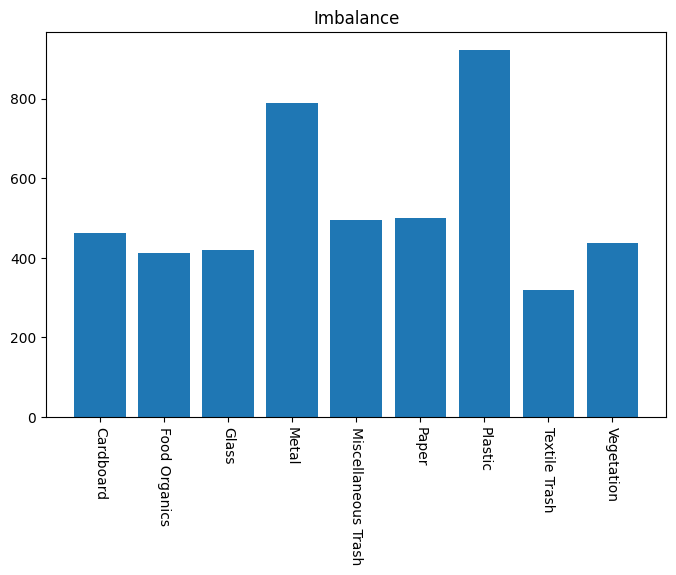

In [ ]:
directory = "/content/drive/MyDrive/RealWaste/RealWaste"
subdirs = ["Cardboard", "Food Organics", "Glass", "Metal", "Miscellaneous Trash", "Paper", "Plastic", "Textile Trash", "Vegetation"]
labels = []
num_files = []
for subdir in subdirs:
    path = directory + "/" + subdir
    print(f"Folder {path} has {len(os.listdir(path))} files.")
    labels.append(subdir)
    num_files.append(len(os.listdir(path)))
fig = plt.figure(figsize=(8,5))
plt.bar(labels, num_files)
plt.xticks(rotation=270)
plt.title("Imbalance")
plt.show()

In [ ]:
def rand_imgs_folder(folder, num_imgs=4, max_cols=4, figsize=(12,8), rootdir="/content/drive/MyDrive/RealWaste/RealWaste"):
    # load and randomly select images
    images = []
    # Use os.path.join to create file paths, ensuring consistency across operating systems.
    source = os.path.join(rootdir, folder)
    for filename in os.listdir(source):
        images.append(filename)
    imgs = np.random.choice(images, num_imgs)

    # establish rows and columns
    if num_imgs <= max_cols:
        cols = num_imgs
        rows = 1
    elif num_imgs > max_cols:
        cols = max_cols
        rows = int(np.ceil(num_imgs / max_cols))

    if num_imgs > 16:
        figsize=(20,14)
    elif num_imgs > 8:
        figsize=(16,11)

    # organize and draw the figure
    f = plt.figure(figsize=figsize)
    # f.axis('off') stopped working for unknown reason
    t = f"Images from {source}"
    plt.title(t)
    img_index = 0                                    # I hate this, but it works and I can't be bothered
    for img in imgs:
        img_index +=1
        f.add_subplot(rows, cols, img_index)
        # Use os.path.join again here to construct the image path
        image = mpimg.imread(os.path.join(source,img))
        plt.imshow(image)
        plt.axis('off')
        plt.title(img)
    plt.show()

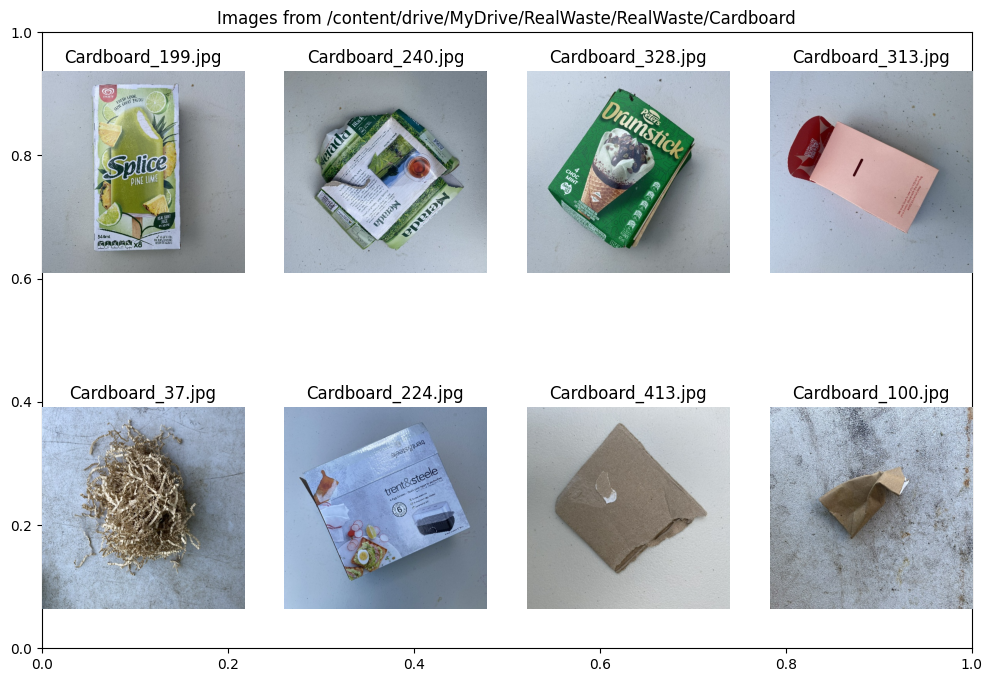

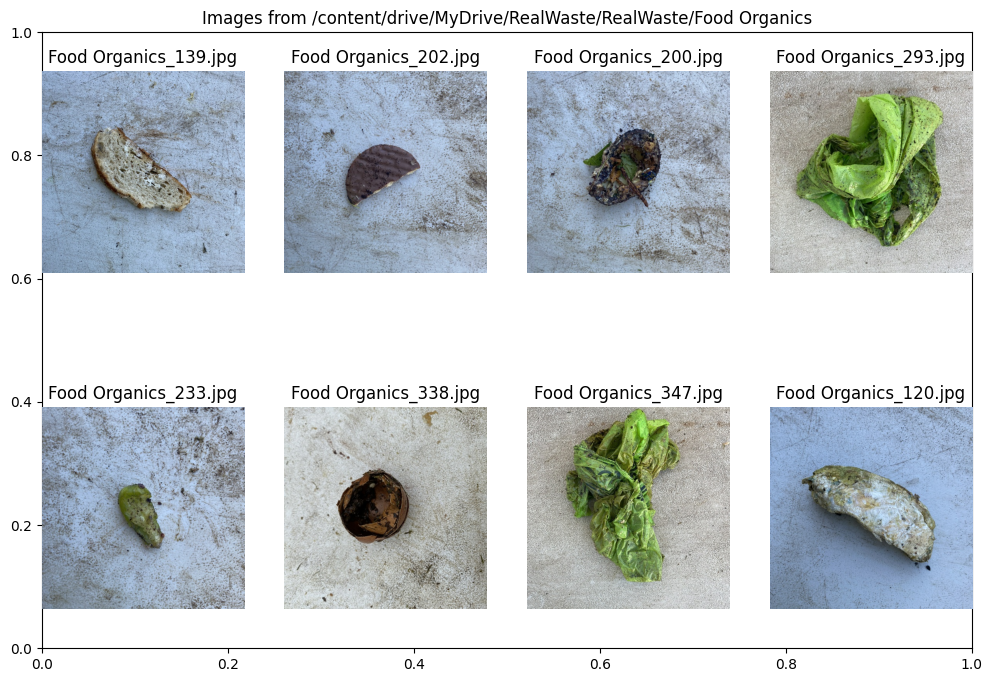

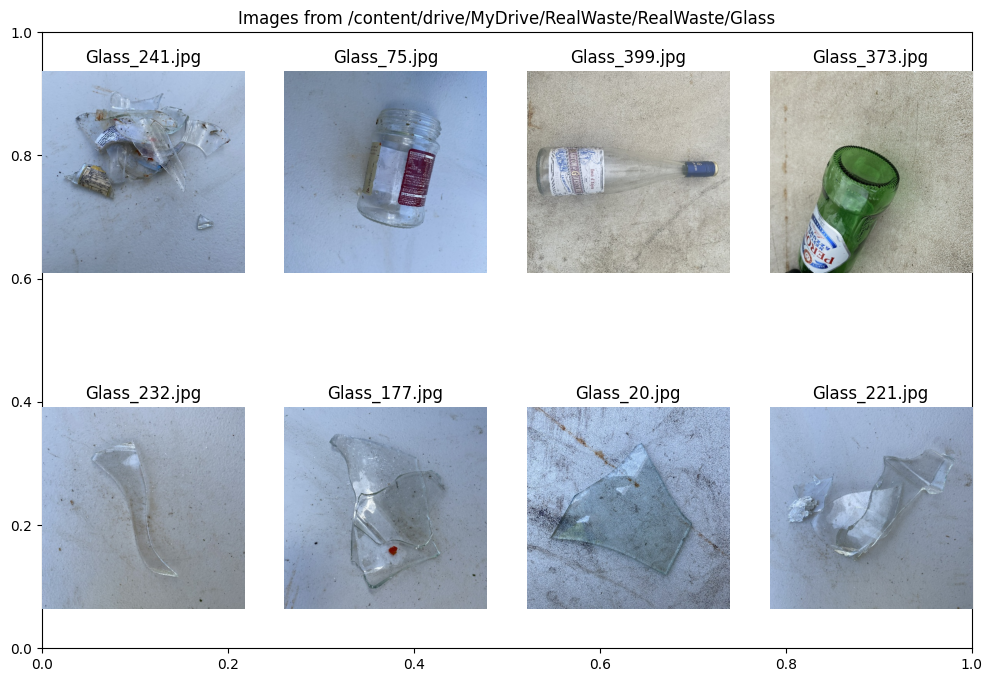

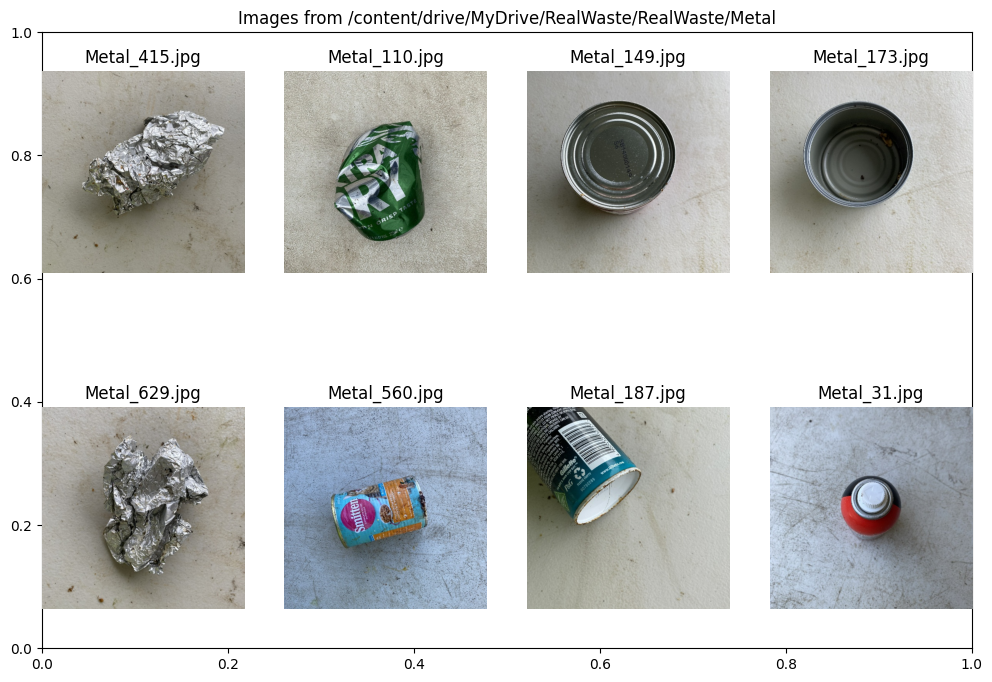

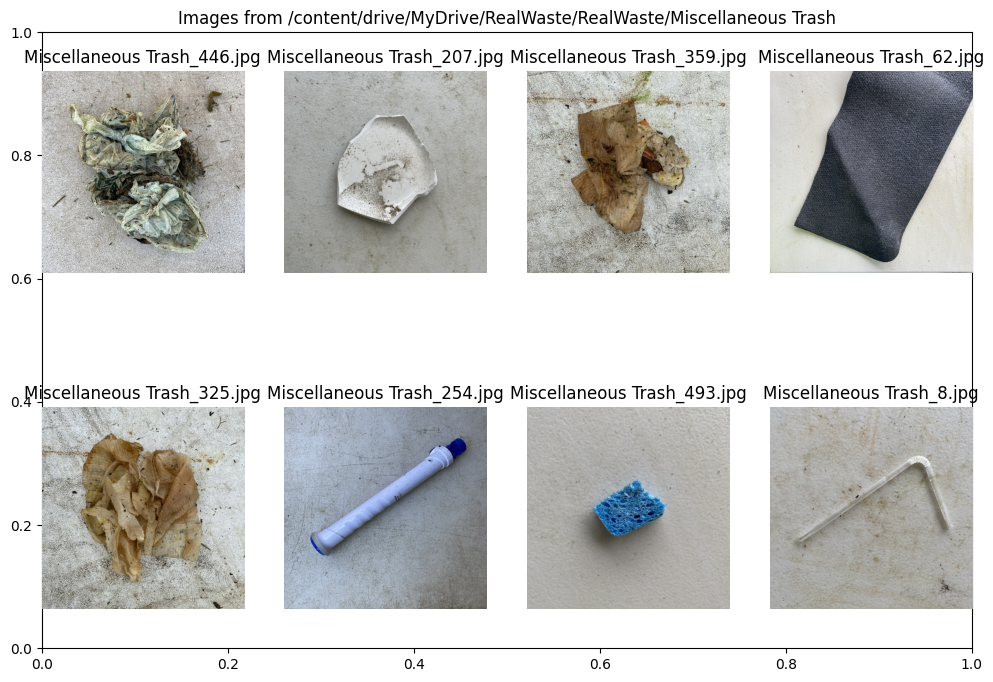

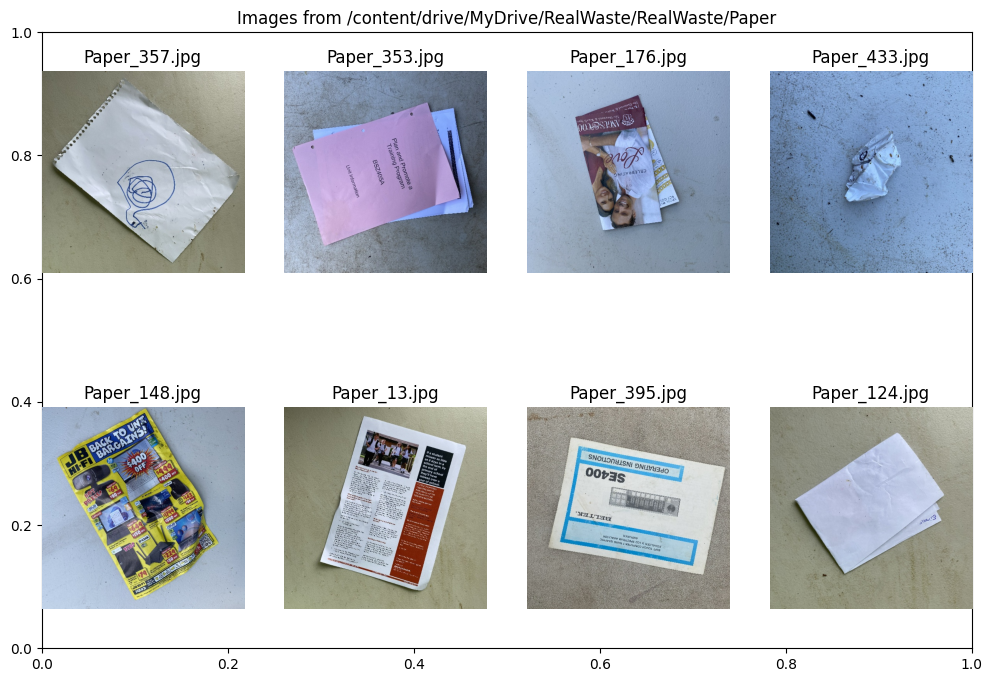

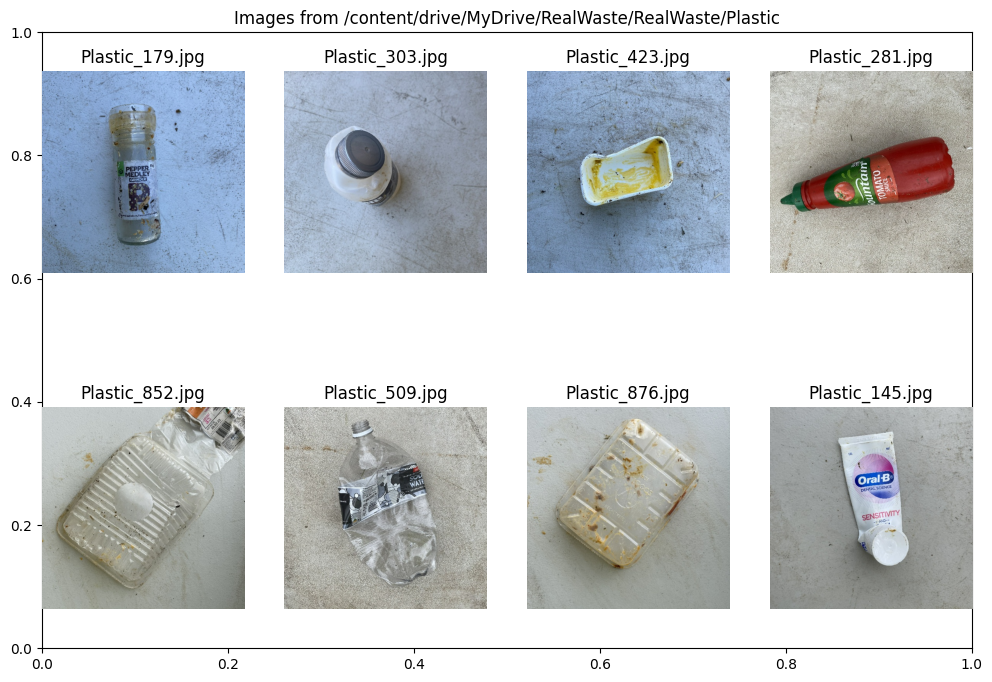

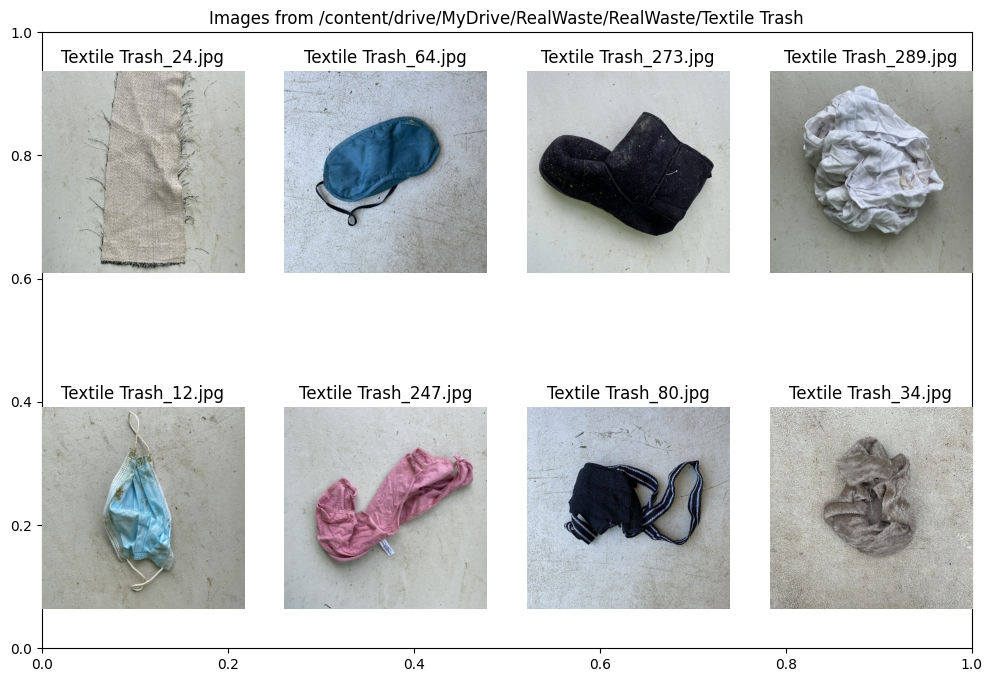

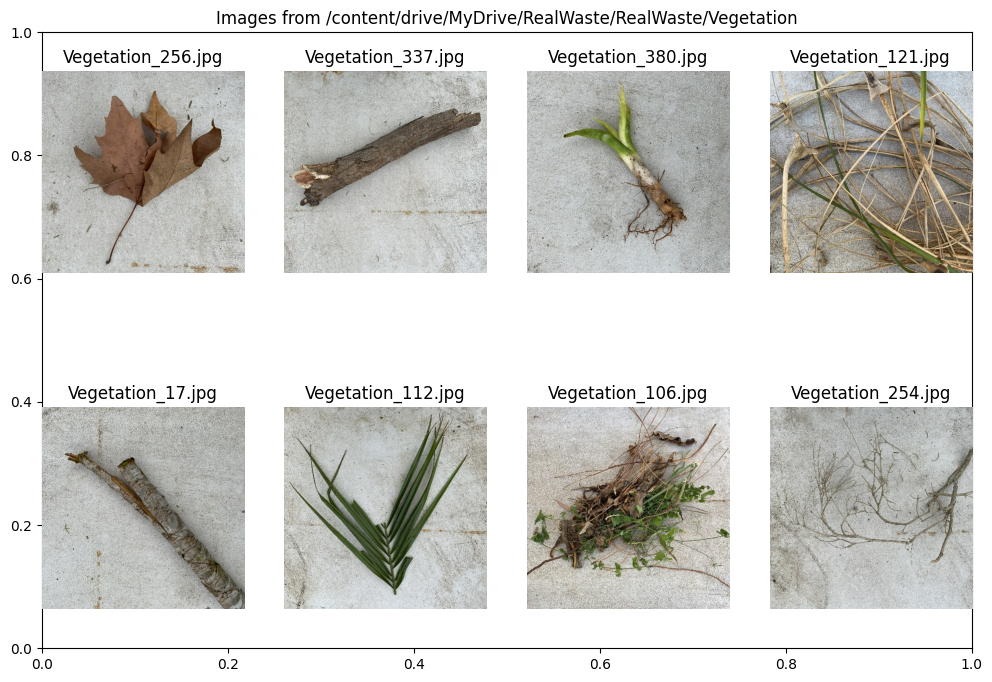

In [ ]:
for subdir in subdirs:
    rand_imgs_folder(subdir, num_imgs=8)

In [ ]:
!pip install Augmentor

In [ ]:
# Import directory navigation libraries
import os
from os import listdir, rmdir
# Import image preprocessing libraries
import numpy as np
import cv2
from shutil import move, copy
from random import randint
from PIL import Image
from tensorflow.image import resize
from tensorflow.io import decode_jpeg, encode_jpeg, write_file
from tensorflow.dtypes import saturate_cast
from random import randint
# Import augmentor for geometric data augmentations
import Augmentor
# Import Colab runtime disconnection
from google.colab import runtime
# Import sleep to allow time for copying to process
from time import sleep


# ------------------------------- Constants -------------------------------- #
# Original dataset path
real_waste_original_path = '/content/drive/MyDrive/RealWaste (1)'
# RealWaste training and validation paths
real_waste_training_path = '/content/real_waste_training_path'
real_waste_validation_path = '/content/real_waste_validation_path'
# RealWaste temporary training and validation paths for augmentation stages
temp_real_waste_training_path = '/content/temp_real_waste_training_path'
temp_real_waste_validation_path = '/content/temp_real_waste_validation_path'
# Test path
test_path = '/content/test_path'
# Labels
labels = ['Cardboard', 'Food Organics', 'Glass', 'Metal', 'Paper', 'Plastic', 'Miscellaneous Trash', 'Textile Trash', 'Vegetation']
# Processed image dimensions
img_height = 524
img_width = 524

In [ ]:

# ------------------------------- Functions -------------------------------- #
# Count images in directory
def count_images(path):
    directory = listdir(path)
    return len(directory)

# Split datasets into training, validation and testing
def split_dataset(input_path, train_path, val_path, test_path, val_prop, test_prop, label):
    # Count images in directory and get file names
    num_files = count_images(input_path + '/' + label)
    file_names = listdir(input_path + '/' + label)

    # Calculated number of validation and testing images
    num_val = round(num_files * val_prop)
    num_test = round(num_files * test_prop)

    # Initialize empty lists for image indexes
    val_list = []
    test_list = []

    # Randomly assign file indexes for validation dataset
    i = 0
    while i < num_val:
        r = randint(1, num_files - 1)
        if r not in val_list:
            val_list.append(r)
            i += 1

    # Move validation dataset files and rename
    name_incrementer = 1
    for j in val_list:
        val_dir = val_path + '/' + label + '/'  # Ensure proper path format
        if not os.path.exists(val_dir):
            os.makedirs(val_dir)  # Create the directory if it doesn't exist
        copy(input_path + '/' + label + '/' + file_names[j], val_dir + label + '_' + str(name_incrementer) + '.jpg')
        sleep(0.05)
        name_incrementer += 1

    # Randomly assign file indexes for the testing dataset
    i = 0
    while i < num_test:
        r = randint(1, num_files - 1)
        if r not in test_list and r not in val_list:
            test_list.append(r)
            i += 1

    # Move test dataset files and rename
    name_incrementer = 1
    for j in test_list:
        test_dir = test_path + '/' + label + '/'  # Ensure proper path format
        if not os.path.exists(test_dir):
            os.makedirs(test_dir)  # Create the directory if it doesn't exist
        copy(input_path + '/' + label + '/' + file_names[j], test_dir + label + '_' + str(name_incrementer) + '.jpg')
        sleep(0.05)
        name_incrementer += 1

    # Move remaining files into the training dataset
    i = 0
    while i < num_files:
        if i not in val_list and i not in test_list:
            train_dir = train_path + '/' + label + '/'  # Ensure proper path format
            if not os.path.exists(train_dir):
                os.makedirs(train_dir)  # Create the directory if it doesn't exist
            copy(input_path + '/' + label + '/' + file_names[i], train_dir + label + '_' + str(name_incrementer) + '.jpg')
            sleep(0.05)
            name_incrementer += 1
        i += 1


In [ ]:

# Resize images
def resize_image(path, width, height):
    directory = listdir(path)
    for file in directory:
        # Read image as binary file
        image = open(path + '/' + file, 'rb')
        binary_representation = image.read()
        decoded_representation = decode_jpeg(binary_representation)
        # Resize binary representation
        resized_image = resize(decoded_representation, [width, height])
        resized_image = saturate_cast(resized_image, 'uint8')
        encoded_image = encode_jpeg(resized_image)
        write_file(path + '/' + file, encoded_image)
        sleep(0.05)

# Check images for RGB mode and convert if required
def convert_rgb_images(path):
    print(path)
    directory = listdir(path)
    for file in directory:
        img = Image.open(path + '/' + file)
        # Convert to RGB mode if not already in format
        if img.mode != 'RGB':
            img.convert('RGB').save(path + '/' + file)
            sleep(0.05)

# Geometric augmentation function: distort and flip
def distort_and_flip(path):
    pipe = Augmentor.Pipeline(path)           # Create pipeline in path of dataset
    pipe.flip_left_right(1)                   # Horizontally flip every image
    pipe.random_distortion(1, 5, 5, 4)        # Randomly distort flipped images
    pipe.process()                            # Process images in pipeline

# Geometric augmentation: rotate and shear
def rotate_and_shear(path):
    pipe = Augmentor.Pipeline(path)           # Create pipeline in path of dataset
    pipe.rotate(1, 25, 25)                    # Rotate every image by 45 degrees
    pipe.shear(1, 15, 15)                     # Randomly shear between 0 and 15 degrees
    pipe.process()                            # Process images in pipeline

# Move files between directories
def move_files(augmented_path, dataset_path, new_file_name):
    directory = listdir(augmented_path)
    name_incrementer = 1
    for file in directory:
        move(augmented_path + '/' + file, dataset_path + '/' + new_file_name + '_' + str(name_incrementer) + '.jpg')
        name_incrementer += 1
        sleep(0.05)

In [ ]:

# ---------------------------- Split RealWaste ----------------------------- #
print('\n|----------------------------------| RealWaste Splitting |---------------------------------|\n')

# Split datasets
for label in labels:
    split_dataset(real_waste_original_path, real_waste_training_path, real_waste_validation_path, test_path, 0.2, 0.1, label)

# Print file counts in paths
for label in labels:
    print('Number of files in RealWaste raw ' + label + ': ' + str(count_images(real_waste_original_path + '/' + label)))
    print('Number of files in RealWaste training ' + label + ': ' + str(count_images(real_waste_training_path + '/' + label)))
    print('Number of files in RealWaste validation ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))
    print('Number of files in RealWaste test ' + label + ': ' + str(count_images(test_path + '/' + label)))
    print()



|----------------------------------| RealWaste Splitting |---------------------------------|

Number of files in RealWaste raw Cardboard: 461
Number of files in RealWaste training Cardboard: 323
Number of files in RealWaste validation Cardboard: 92
Number of files in RealWaste test Cardboard: 46

Number of files in RealWaste raw Food Organics: 411
Number of files in RealWaste training Food Organics: 288
Number of files in RealWaste validation Food Organics: 82
Number of files in RealWaste test Food Organics: 41

Number of files in RealWaste raw Glass: 420
Number of files in RealWaste training Glass: 294
Number of files in RealWaste validation Glass: 84
Number of files in RealWaste test Glass: 42

Number of files in RealWaste raw Metal: 790
Number of files in RealWaste training Metal: 553
Number of files in RealWaste validation Metal: 158
Number of files in RealWaste test Metal: 79

Number of files in RealWaste raw Paper: 500
Number of files in RealWaste training Paper: 350
Number of f

In [ ]:

# ---------------------- Pre-Process Images RealWaste ---------------------- #
print('|--------------------------------| RealWaste Pre-Processing |------------------------------|\n')
# Preprocess images
for label in labels:
    # RealWaste training
    print('\nBefore preprocessing RealWaste training ' + label + ': ' + str(count_images(real_waste_training_path + '/' + label)))
    convert_rgb_images(real_waste_training_path + '/' + label)
    resize_image(real_waste_training_path + '/' + label, img_width, img_height)
    print('After preprocessing RealWaste training ' + label + ': ' + str(count_images(real_waste_training_path + '/' + label)))

    # RealWaste validation
    print('Before preprocessing RealWaste validation ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))
    convert_rgb_images(real_waste_validation_path + '/' + label)
    resize_image(real_waste_validation_path + '/' + label, img_width, img_height)
    print('After preprocessing RealWaste validation ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))

    # Testing
    print('Before preprocessing test ' + label + ': ' + str(count_images(test_path + '/' + label)))
    convert_rgb_images(test_path + '/' + label)
    resize_image(test_path + '/' + label, img_width, img_height)
    print('After preprocessing test ' + label + ': ' + str(count_images(test_path + '/' + label)))
    print()


|--------------------------------| RealWaste Pre-Processing |------------------------------|


Before preprocessing RealWaste training Cardboard: 323
/content/real_waste_training_path/Cardboard
After preprocessing RealWaste training Cardboard: 323
Before preprocessing RealWaste validation Cardboard: 92
/content/real_waste_validation_path/Cardboard
After preprocessing RealWaste validation Cardboard: 92
Before preprocessing test Cardboard: 46
/content/test_path/Cardboard
After preprocessing test Cardboard: 46


Before preprocessing RealWaste training Food Organics: 288
/content/real_waste_training_path/Food Organics
After preprocessing RealWaste training Food Organics: 288
Before preprocessing RealWaste validation Food Organics: 82
/content/real_waste_validation_path/Food Organics
After preprocessing RealWaste validation Food Organics: 82
Before preprocessing test Food Organics: 41
/content/test_path/Food Organics
After preprocessing test Food Organics: 41


Before preprocessing RealWast

In [ ]:

# ---------------------- Distort and Flip RealWaste ------------------------ #
print('|----------------------| RealWaste Augmentation - Distort and Flip |---------------------|\n')

# Perform augmentation
for label in labels:
    # RealWaste training
    print('\nTraining count RealWaste '+ label + ': ' + str(count_images(real_waste_training_path + '/' + label)))
    distort_and_flip(real_waste_training_path + '/' + label)
    print('After augmenting training ' + label + ': ' + str(count_images(real_waste_training_path + '/' + label)))

    # RealWaste validation
    print('Validation count RealWaste ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))
    distort_and_flip(real_waste_validation_path + '/' + label)
    print('After augmenting validation ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))

# ----------------------- Rotate and Shear RealWaste ----------------------- #
print('|----------------------| RealWaste Augmentation - Rotate and Shear |---------------------|\n')

# Perform augmentation
for label in labels:
    # RealWaste training
    print('\nTraining count RealWaste '+ label + ': ' + str(count_images(real_waste_training_path + '/' + label)))
    rotate_and_shear(real_waste_training_path + '/' + label)
    print('After augmenting training ' + label + ': ' + str(count_images(real_waste_training_path + '/' + label)))

    # RealWaste validation
    print('Validation count RealWaste ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))
    rotate_and_shear(real_waste_validation_path + '/' + label)
    print('After augmenting validation ' + label + ': ' + str(count_images(real_waste_validation_path + '/' + label)))


|----------------------| RealWaste Augmentation - Distort and Flip |---------------------|


Training count RealWaste Cardboard: 323
Initialised with 323 image(s) found.
Output directory set to /content/real_waste_training_path/Cardboard/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303A71F0>: 100%|██████████| 323/323 [00:13<00:00, 23.88 Samples/s]


After augmenting training Cardboard: 324
Validation count RealWaste Cardboard: 92
Initialised with 92 image(s) found.
Output directory set to /content/real_waste_validation_path/Cardboard/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303A44F0>: 100%|██████████| 92/92 [00:03<00:00, 29.43 Samples/s]


After augmenting validation Cardboard: 93

Training count RealWaste Food Organics: 288
Initialised with 288 image(s) found.
Output directory set to /content/real_waste_training_path/Food Organics/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530344130>: 100%|██████████| 288/288 [00:12<00:00, 22.93 Samples/s]


After augmenting training Food Organics: 289
Validation count RealWaste Food Organics: 82
Initialised with 82 image(s) found.
Output directory set to /content/real_waste_validation_path/Food Organics/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303455D0>: 100%|██████████| 82/82 [00:02<00:00, 28.18 Samples/s]


After augmenting validation Food Organics: 83

Training count RealWaste Glass: 294
Initialised with 294 image(s) found.
Output directory set to /content/real_waste_training_path/Glass/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303B3A60>: 100%|██████████| 294/294 [00:12<00:00, 22.88 Samples/s]


After augmenting training Glass: 295
Validation count RealWaste Glass: 84
Initialised with 84 image(s) found.
Output directory set to /content/real_waste_validation_path/Glass/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303B0B20>: 100%|██████████| 84/84 [00:03<00:00, 26.96 Samples/s]


After augmenting validation Glass: 85

Training count RealWaste Metal: 553
Initialised with 553 image(s) found.
Output directory set to /content/real_waste_training_path/Metal/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530263310>: 100%|██████████| 553/553 [00:23<00:00, 23.21 Samples/s]


After augmenting training Metal: 554
Validation count RealWaste Metal: 158
Initialised with 158 image(s) found.
Output directory set to /content/real_waste_validation_path/Metal/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303B3A90>: 100%|██████████| 158/158 [00:07<00:00, 19.88 Samples/s]


After augmenting validation Metal: 159

Training count RealWaste Paper: 350
Initialised with 350 image(s) found.
Output directory set to /content/real_waste_training_path/Paper/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53035FB80>: 100%|██████████| 350/350 [00:15<00:00, 22.17 Samples/s]


After augmenting training Paper: 351
Validation count RealWaste Paper: 100
Initialised with 100 image(s) found.
Output directory set to /content/real_waste_validation_path/Paper/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53035D5A0>: 100%|██████████| 100/100 [00:03<00:00, 26.70 Samples/s]


After augmenting validation Paper: 101

Training count RealWaste Plastic: 645
Initialised with 645 image(s) found.
Output directory set to /content/real_waste_training_path/Plastic/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53029BD60>: 100%|██████████| 645/645 [00:29<00:00, 22.15 Samples/s]


After augmenting training Plastic: 646
Validation count RealWaste Plastic: 184
Initialised with 184 image(s) found.
Output directory set to /content/real_waste_validation_path/Plastic/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530248520>: 100%|██████████| 184/184 [00:07<00:00, 23.13 Samples/s]


After augmenting validation Plastic: 185

Training count RealWaste Miscellaneous Trash: 346
Initialised with 346 image(s) found.
Output directory set to /content/real_waste_training_path/Miscellaneous Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5302607F0>: 100%|██████████| 346/346 [00:17<00:00, 20.18 Samples/s]


After augmenting training Miscellaneous Trash: 347
Validation count RealWaste Miscellaneous Trash: 99
Initialised with 99 image(s) found.
Output directory set to /content/real_waste_validation_path/Miscellaneous Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53037EE00>: 100%|██████████| 99/99 [00:04<00:00, 21.77 Samples/s]


After augmenting validation Miscellaneous Trash: 100

Training count RealWaste Textile Trash: 222
Initialised with 222 image(s) found.
Output directory set to /content/real_waste_training_path/Textile Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530346350>: 100%|██████████| 222/222 [00:10<00:00, 22.15 Samples/s]


After augmenting training Textile Trash: 223
Validation count RealWaste Textile Trash: 64
Initialised with 64 image(s) found.
Output directory set to /content/real_waste_validation_path/Textile Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530346710>: 100%|██████████| 64/64 [00:02<00:00, 26.64 Samples/s]


After augmenting validation Textile Trash: 65

Training count RealWaste Vegetation: 305
Initialised with 305 image(s) found.
Output directory set to /content/real_waste_training_path/Vegetation/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530249F30>: 100%|██████████| 305/305 [00:14<00:00, 21.37 Samples/s]


After augmenting training Vegetation: 306
Validation count RealWaste Vegetation: 87
Initialised with 87 image(s) found.
Output directory set to /content/real_waste_validation_path/Vegetation/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530249030>: 100%|██████████| 87/87 [00:03<00:00, 25.69 Samples/s]


After augmenting validation Vegetation: 88
|----------------------| RealWaste Augmentation - Rotate and Shear |---------------------|


Training count RealWaste Cardboard: 324
Initialised with 323 image(s) found.
Output directory set to /content/real_waste_training_path/Cardboard/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5CCF62A70>: 100%|██████████| 323/323 [00:27<00:00, 11.69 Samples/s]


After augmenting training Cardboard: 324
Validation count RealWaste Cardboard: 93
Initialised with 92 image(s) found.
Output directory set to /content/real_waste_validation_path/Cardboard/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303A4460>: 100%|██████████| 92/92 [00:06<00:00, 13.28 Samples/s]


After augmenting validation Cardboard: 93

Training count RealWaste Food Organics: 289
Initialised with 288 image(s) found.
Output directory set to /content/real_waste_training_path/Food Organics/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53024B190>: 100%|██████████| 288/288 [00:25<00:00, 11.47 Samples/s]


After augmenting training Food Organics: 289
Validation count RealWaste Food Organics: 83
Initialised with 82 image(s) found.
Output directory set to /content/real_waste_validation_path/Food Organics/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53024BD30>: 100%|██████████| 82/82 [00:05<00:00, 13.81 Samples/s]


After augmenting validation Food Organics: 83

Training count RealWaste Glass: 295
Initialised with 294 image(s) found.
Output directory set to /content/real_waste_training_path/Glass/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53035D210>: 100%|██████████| 294/294 [00:25<00:00, 11.42 Samples/s]


After augmenting training Glass: 295
Validation count RealWaste Glass: 85
Initialised with 84 image(s) found.
Output directory set to /content/real_waste_validation_path/Glass/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF53023D480>: 100%|██████████| 84/84 [00:05<00:00, 14.02 Samples/s]


After augmenting validation Glass: 85

Training count RealWaste Metal: 554
Initialised with 553 image(s) found.
Output directory set to /content/real_waste_training_path/Metal/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5302278E0>: 100%|██████████| 553/553 [00:46<00:00, 11.79 Samples/s]


After augmenting training Metal: 554
Validation count RealWaste Metal: 159
Initialised with 158 image(s) found.
Output directory set to /content/real_waste_validation_path/Metal/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5303CF9A0>: 100%|██████████| 158/158 [00:15<00:00, 10.43 Samples/s]


After augmenting validation Metal: 159

Training count RealWaste Paper: 351
Initialised with 350 image(s) found.
Output directory set to /content/real_waste_training_path/Paper/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531DD7220>: 100%|██████████| 350/350 [00:29<00:00, 12.01 Samples/s]


After augmenting training Paper: 351
Validation count RealWaste Paper: 101
Initialised with 100 image(s) found.
Output directory set to /content/real_waste_validation_path/Paper/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531DD7910>: 100%|██████████| 100/100 [00:08<00:00, 11.13 Samples/s]


After augmenting validation Paper: 101

Training count RealWaste Plastic: 646
Initialised with 645 image(s) found.
Output directory set to /content/real_waste_training_path/Plastic/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5302D72B0>: 100%|██████████| 645/645 [00:53<00:00, 12.10 Samples/s]


After augmenting training Plastic: 646
Validation count RealWaste Plastic: 185
Initialised with 184 image(s) found.
Output directory set to /content/real_waste_validation_path/Plastic/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF530262B30>: 100%|██████████| 184/184 [00:16<00:00, 11.45 Samples/s]


After augmenting validation Plastic: 185

Training count RealWaste Miscellaneous Trash: 347
Initialised with 346 image(s) found.
Output directory set to /content/real_waste_training_path/Miscellaneous Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF54A0476D0>: 100%|██████████| 346/346 [00:31<00:00, 11.04 Samples/s]


After augmenting training Miscellaneous Trash: 347
Validation count RealWaste Miscellaneous Trash: 100
Initialised with 99 image(s) found.
Output directory set to /content/real_waste_validation_path/Miscellaneous Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF5CCF63D00>: 100%|██████████| 99/99 [00:07<00:00, 12.60 Samples/s]


After augmenting validation Miscellaneous Trash: 100

Training count RealWaste Textile Trash: 223
Initialised with 222 image(s) found.
Output directory set to /content/real_waste_training_path/Textile Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531C335B0>: 100%|██████████| 222/222 [00:19<00:00, 11.49 Samples/s]


After augmenting training Textile Trash: 223
Validation count RealWaste Textile Trash: 65
Initialised with 64 image(s) found.
Output directory set to /content/real_waste_validation_path/Textile Trash/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531C30EE0>: 100%|██████████| 64/64 [00:05<00:00, 12.04 Samples/s]


After augmenting validation Textile Trash: 65

Training count RealWaste Vegetation: 306
Initialised with 305 image(s) found.
Output directory set to /content/real_waste_training_path/Vegetation/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531CAB580>: 100%|██████████| 305/305 [00:25<00:00, 12.13 Samples/s]


After augmenting training Vegetation: 306
Validation count RealWaste Vegetation: 88
Initialised with 87 image(s) found.
Output directory set to /content/real_waste_validation_path/Vegetation/output.

Processing <PIL.Image.Image image mode=RGB size=524x524 at 0x7AF531C30970>: 100%|██████████| 87/87 [00:10<00:00,  8.31 Samples/s]

After augmenting validation Vegetation: 88


# Real Waste Model

In [ ]:
# some necessary imports... may need to trim later
# actually this is a total, disgraceful mess - clean it up!

import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

from keras.utils import np_utils, plot_model, to_categorical
from keras.models import Sequential, Model
# I will need them all actually
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout, BatchNormalization, GlobalAveragePooling2D
from keras import layers, Input
from keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import ResNet50, DenseNet121, EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import tensorflow as tf

import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

from IPython.display import display, Image
import PIL

import pickle


## Classification using basic CNN's

In [ ]:
# I'd like to plot accuracy against training epochs...

def plot_epochs(model_fit, model_id=""):
    acc = model_fit.history['accuracy']
    val_acc = model_fit.history['val_accuracy']
    epochs = list(range(1, (len(acc) + 1)))
    plt.plot(epochs, acc, label="training accuracy")
    plt.plot(epochs, val_acc, label="validation accuracy")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.xticks(epochs)
    plt.title("accuracy for CNN model " + model_id)
    plt.legend()
    plt.show()

In [ ]:
# Define dataset directories
train_dir = '/content/real_waste_training_path'
val_dir = '/content/real_waste_validation_path'
test_dir = '/content/test_path'

X_train_aug = np.asarray(train_dir)
X_test = np.asarray(test_dir)
y_train_aug = np.asarray(train_dir)
y_test = np.asarray(test_dir)

In [ ]:
CNN_model_5 = Sequential([
    Conv2D(128,(3,3),padding='same',activation='relu',input_shape=(131,131,1)),
    MaxPooling2D(),
    Conv2D(64,(3,3),padding='same',activation='relu'),
    MaxPooling2D(),
    Conv2D(64,(3,3),padding='same',activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(128,activation='relu'),
    Dense(128,activation='relu'),
    Dropout(0.4),
    Dense(128,activation='relu'),
    Dropout(0.4),
    Dense(9,activation='softmax')
])

CNN_model_5.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 131, 131, 128)     1280      
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 65, 65, 128)      0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 65, 65, 64)        73792     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 32, 32, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 64)        36928     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 16, 16, 64)      

In [ ]:
CNN_model_5.compile(
    optimizer='adam',
    loss = 'sparse_categorical_crossentropy',
    metrics='accuracy'
)


CNN_model_5_fit = CNN_model_5.fit(X_train_aug, y_train_aug, validation_data=(X_test, y_test), batch_size=32, epochs=20)

Epoch 1/20
476/476 [==============================] - 370s 775ms/step - loss: 2.2090 - accuracy: 0.2038 - val_loss: 2.0383 - val_accuracy: 0.2860
Epoch 2/20
476/476 [==============================] - 366s 769ms/step - loss: 2.0633 - accuracy: 0.2504 - val_loss: 1.8771 - val_accuracy: 0.3218
Epoch 3/20
476/476 [==============================] - 362s 761ms/step - loss: 1.9474 - accuracy: 0.2862 - val_loss: 1.6883 - val_accuracy: 0.4069
Epoch 4/20
476/476 [==============================] - 364s 764ms/step - loss: 1.8384 - accuracy: 0.3319 - val_loss: 1.5686 - val_accuracy: 0.4532
Epoch 5/20
476/476 [==============================] - 365s 766ms/step - loss: 1.7343 - accuracy: 0.3791 - val_loss: 1.4397 - val_accuracy: 0.5016
Epoch 6/20
476/476 [==============================] - 365s 766ms/step - loss: 1.6180 - accuracy: 0.4194 - val_loss: 1.2906 - val_accuracy: 0.5542
Epoch 7/20
476/476 [==============================] - 364s 766ms/step - loss: 1.4923 - accuracy: 0.4684 - val_loss: 1.2798 -

These models are all very _casual_:  I threw together some Conv2D layers and some Dense layers, with MaxPooling, Flatten, and Dropout layers as appropriate.  At a first glance, some of the models achieved much higher accuracy than I would have expected. With nine categories, "coin toss" accuracy would be, of course, 0.1111 - and a couple of these models, despite the crudeness and simplicity of their design, edged over 50%.  

The fitting behavior will be easier to observe by plotting accuracies vs epochs:

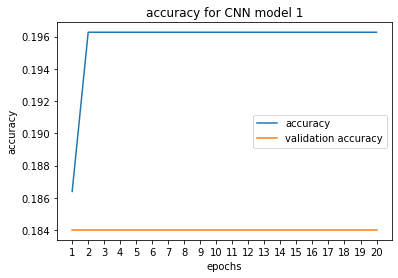

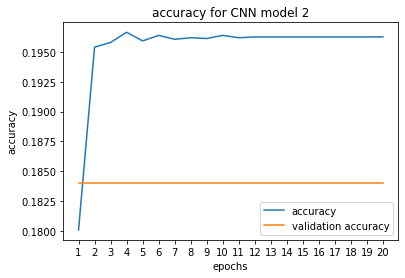

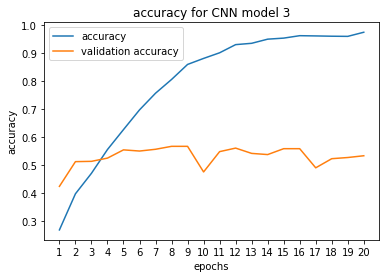

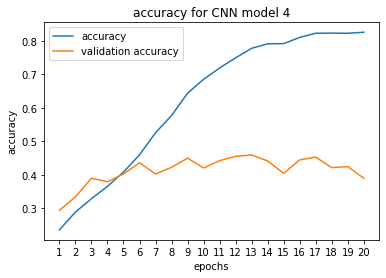

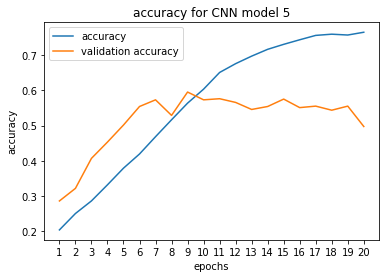

In [ ]:
elist = list(range(1, 6))
for e in elist:
    stringname = "CNN_model_" + str(e) + "_fit"
    plot_epochs(eval(stringname), str(e))

From these plots it's easy to see how inadequate models 1 and 2 are:  validation accuracy remains absolutely flat.  (Specifically, what does this mean?)  Obviously these are not promising models at all.  Models 3 - 5 demonstrate at least some progress with validation - but also, some overfitting, even within 20 epochs.

I can also note: model 2, which adds only another Dense layer as compared to model 1, converges to exactly the same values for both accuracies.  The extra Dense layer doesn't seem to have done much of anything.  In models 3 - 5, though, adding additional Conv2D layers at the front seems to have improved accuracy substantially.  Of these models, model 4 seems the worst.  In model 5, the dropout rate is increased, which seems to boost validation accuracy a bit.

It might be worthwhile to make some more simple models from scratch, just to get a handle on how these hyperparameters (if that's appropriate to call them) play out.  But in terms of building a more useful model, it might be better to apply transfer learning to an existing visual classifier.

Not only is validation accuracy dismal - it doesn't even demonstrate any improvement!  Let's try more IV3 models.  Some more trailing layers might help.  Alternatively - it might be interesting to see what happens if we make the IV3 layers trainable.  I'm going to start with the former.

## **MobileNetV2**

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout
from tensorflow.keras.applications import MobileNetV2

In [ ]:
path = "/kaggle/input/real-waste/realwaste-main/RealWaste"

In [ ]:
train=tf.keras.utils.image_dataset_from_directory(
    path,
    color_mode="rgb",
    batch_size=16,
    subset="training",
    image_size=(224,224),
    seed=123,
    shuffle=True,
    validation_split=0.2,
    )

Found 4752 files belonging to 9 classes.
Using 3802 files for training.


In [ ]:
validation=tf.keras.utils.image_dataset_from_directory(
    path,
    color_mode="rgb",
    batch_size=16,
    subset="validation",
    image_size=(224,224),
    seed=123,
    shuffle=True,
    validation_split=0.2,
    )

Found 4752 files belonging to 9 classes.
Using 950 files for validation.


In [ ]:
def process(image,label):
    image = tf.cast(image/255. ,tf.float32)
    return image,label

train = train.map(process)
validation = validation.map(process)

In [ ]:

model = Sequential()

model.add(tf.keras.applications.mobilenet_v2.MobileNetV2(weights='imagenet', include_top=False,  input_shape=(224,224,3)))
for layer in model.layers:
  layer.trainable = True
model.add(Flatten())
model.add(BatchNormalization())
model.add(Dropout(0.2))
model.add(Dense(256,activation='relu'))
model.add(BatchNormalization())
model.add(Dense(125,activation='relu'))
model.add(BatchNormalization())
model.add(Dense(9,activation='softmax'))

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ ?                      │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [ ]:
model.compile(optimizer = keras.optimizers.Adam(learning_rate=1e-5),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history = model.fit(train,epochs=25,validation_data=validation)

Epoch 1/25


I0000 00:00:1732466889.612764     107 service.cc:145] XLA service 0x7e138802da70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732466889.612812     107 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1732466889.612817     107 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  2/238 ━━━━━━━━━━━━━━━━━━━━ 19s 81ms/step - accuracy: 0.1094 - loss: 2.6456   

I0000 00:00:1732466913.032037     107 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


238/238 ━━━━━━━━━━━━━━━━━━━━ 88s 174ms/step - accuracy: 0.2632 - loss: 2.2534 - val_accuracy: 0.4084 - val_loss: 1.7921
Epoch 2/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 66ms/step - accuracy: 0.6127 - loss: 1.1504 - val_accuracy: 0.5221 - val_loss: 1.4740
Epoch 3/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - accuracy: 0.7118 - loss: 0.8737 - val_accuracy: 0.5968 - val_loss: 1.2414
Epoch 4/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - accuracy: 0.7715 - loss: 0.6814 - val_accuracy: 0.6547 - val_loss: 1.0614
Epoch 5/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 67ms/step - accuracy: 0.8118 - loss: 0.5855 - val_accuracy: 0.6758 - val_loss: 0.9780
Epoch 6/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.8455 - loss: 0.4746 - val_accuracy: 0.7000 - val_loss: 0.9217
Epoch 7/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.8711 - loss: 0.4046 - val_accuracy: 0.7305 - val_loss: 0.8412
Epoch 8/25
238/238 ━━━━━━━━━━━━━━━━━━━━ 16s 68ms/step - accuracy: 0.9046 - loss: 0.3510 - val_accura

In [ ]:
model.save("mobilenetv2.keras")

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


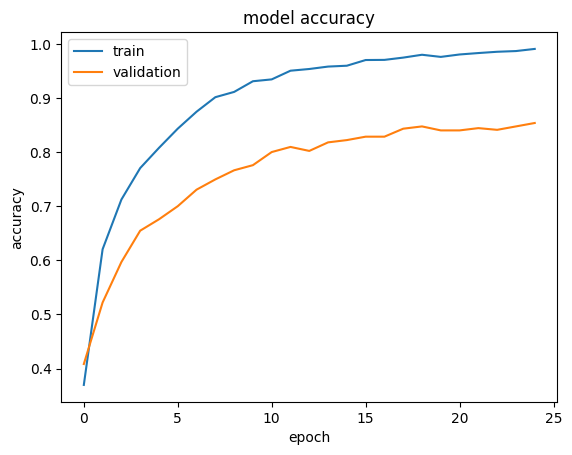

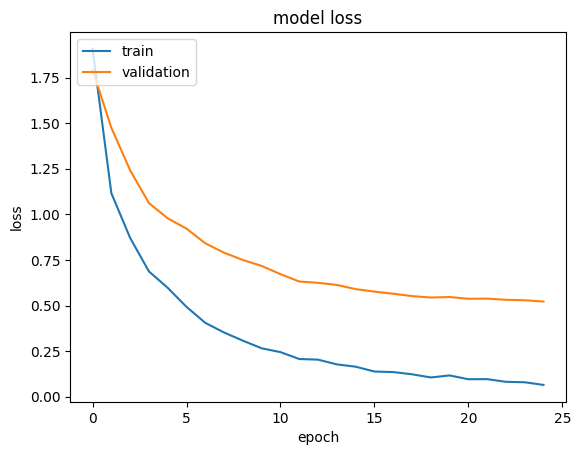

In [ ]:
import matplotlib.pyplot as plt

print(history.history.keys())
#  "Accuracy"
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('Acc5.png')
plt.show();
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('Loss5.png')
plt.show();

In [ ]:
y_pred = model.predict(validation)

60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step


In [ ]:
y_pred_ = []
for i in range (len(y_pred)):
    y_pred_.append(np.argmax(y_pred[i]))

In [ ]:
labels_list = []
for images,labels in validation:
    labels_list.append(labels)

In [ ]:
for i in range (len(labels_list)):
    labels_list[i] = labels_list[i].numpy().tolist()

In [ ]:
flattened_list = []
for sublist in labels_list:
    flattened_list.extend(sublist)

In [ ]:
true_labels = flattened_list
predicted_labels = y_pred_

In [ ]:
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

# Assuming `true_labels` are your ground truth labels and `predicted_labels` are the model predictions
f1 = f1_score(true_labels, predicted_labels, average='weighted')
precision = precision_score(true_labels, predicted_labels, average='weighted')
recall = recall_score(true_labels, predicted_labels, average='weighted')

print(f"F1 Score: {f1:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")


F1 Score: 0.7721
Precision: 0.8322
Recall: 0.8132


# **Inceptionv3**

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [ ]:
directory = "/kaggle/input/real-waste/realwaste-main/RealWaste"

In [ ]:
train=tf.keras.utils.image_dataset_from_directory(
    directory,
    color_mode='rgb',
    batch_size=16,
    subset="training",
    image_size=(524, 524),
    seed=123,
    shuffle=True,
    validation_split=0.2,
)

Found 4752 files belonging to 9 classes.
Using 3802 files for training.


In [ ]:
test=tf.keras.utils.image_dataset_from_directory(
    directory,
    color_mode='rgb',
    batch_size=16,
    subset="validation",
    image_size=(524, 524),
    seed=123,
    shuffle=True,
    validation_split=0.2,
)

Found 4752 files belonging to 9 classes.
Using 950 files for validation.


In [ ]:
inception_model = tf.keras.applications.InceptionV3(input_shape=(524,524,3), include_top=False, weights='imagenet')

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
new_model = tf.keras.models.Sequential()
new_model.add(tf.keras.layers.Rescaling(scale=1./127.5,offset=-1))
new_model.add(inception_model)

In [ ]:
new_model.add(tf.keras.layers.Flatten())
new_model.add(tf.keras.layers.Dropout(0.3))
new_model.add(tf.keras.layers.Dense(256, activation="relu"))
new_model.add(tf.keras.layers.Dense(9, activation="softmax"))

In [ ]:
new_model.build(input_shape=(1,524,524,3))

In [ ]:
loss_function='sparse_categorical_crossentropy'
optimizer=tf.keras.optimizers.Adam(learning_rate = 0.00001)
metrics=['accuracy']

In [ ]:
new_model.compile(loss=loss_function, optimizer=optimizer, metrics=metrics)

In [ ]:
new_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (1, 524, 524, 3)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ inception_v3 (Functional)       │ (1, 15, 15, 2048)      │    21,802,784 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (1, 460800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (1, 460800)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (1, 256)               │   117,965,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (1, 9)                 │         2,313 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 139,770,153 (533.18 MB)

 Trainable params: 139,735,721 (533.05 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [ ]:
history = new_model.fit(
    train,
    epochs=10,
    batch_size=32,
    validation_data=(test)
)

Epoch 1/10


I0000 00:00:1732316854.121089     108 service.cc:145] XLA service 0x7e1e38001ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732316854.121150     108 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-11-22 23:08:00.875934: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[192,80,3,3]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,80,129,129]{3,2,1,0}, f32[16,192,127,127]{3,2,1,0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-22 23:08:01.246985: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.37115827s
Trying algorithm eng0{} for conv (f32[192,8

237/238 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step - accuracy: 0.4709 - loss: 1.5924

I0000 00:00:1732317028.070635     108 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_56', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_38', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_37', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_39', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_34', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_35', 4 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_27', 4 by

238/238 ━━━━━━━━━━━━━━━━━━━━ 222s 594ms/step - accuracy: 0.4721 - loss: 1.5886 - val_accuracy: 0.7821 - val_loss: 0.5939
Epoch 2/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 374ms/step - accuracy: 0.9107 - loss: 0.2709 - val_accuracy: 0.8242 - val_loss: 0.5226
Epoch 3/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 375ms/step - accuracy: 0.9776 - loss: 0.0889 - val_accuracy: 0.8358 - val_loss: 0.5041
Epoch 4/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 376ms/step - accuracy: 0.9916 - loss: 0.0358 - val_accuracy: 0.8589 - val_loss: 0.4594
Epoch 5/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 375ms/step - accuracy: 0.9954 - loss: 0.0235 - val_accuracy: 0.8705 - val_loss: 0.4687
Epoch 6/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 375ms/step - accuracy: 0.9970 - loss: 0.0184 - val_accuracy: 0.8695 - val_loss: 0.4626
Epoch 7/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 375ms/step - accuracy: 0.9959 - loss: 0.0169 - val_accuracy: 0.8705 - val_loss: 0.4498
Epoch 8/10
238/238 ━━━━━━━━━━━━━━━━━━━━ 89s 375ms/step - accuracy: 0.9963 - loss: 0.0109 - va

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


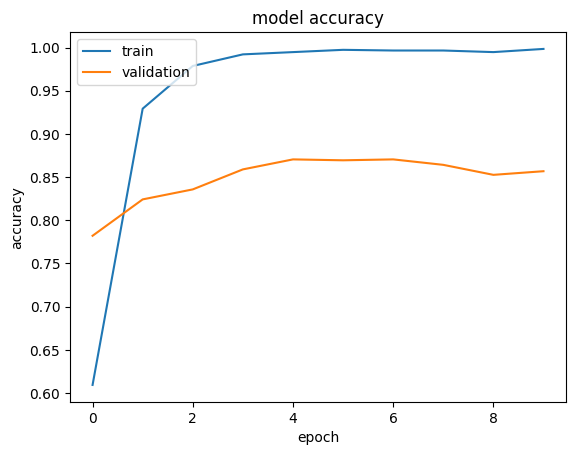

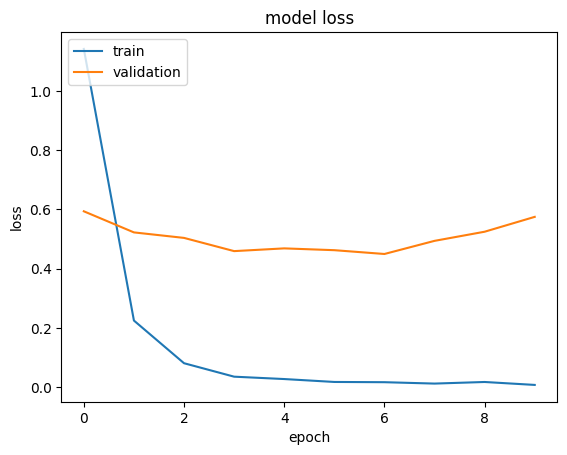

In [ ]:
print(history.history.keys())
#  "Accuracy"
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('Acc5.png')
plt.show();
# "Loss"
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('Loss5.png')
plt.show();

In [ ]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = new_model.evaluate(test, verbose=1)

# Print the results
print(f"Test Accuracy: {test_accuracy * 100:.2f}%")
print(f"Test Loss: {test_loss:.4f}")


60/60 ━━━━━━━━━━━━━━━━━━━━ 6s 100ms/step - accuracy: 0.8359 - loss: 0.7255
Test Accuracy: 85.68%
Test Loss: 0.5751


In [ ]:
import numpy as np

# Get predictions
predictions = new_model.predict(test)
predicted_classes = np.argmax(predictions, axis=1)

# Extract true labels
true_classes = np.concatenate([y for x, y in test], axis=0)

# Print a few examples
print("Predicted classes:", predicted_classes[:10])
print("True classes:     ", true_classes[:10])


60/60 ━━━━━━━━━━━━━━━━━━━━ 15s 169ms/step
Predicted classes: [3 6 1 6 8 7 0 6 6 2]
True classes:      [8 8 6 1 3 3 8 0 1 6]


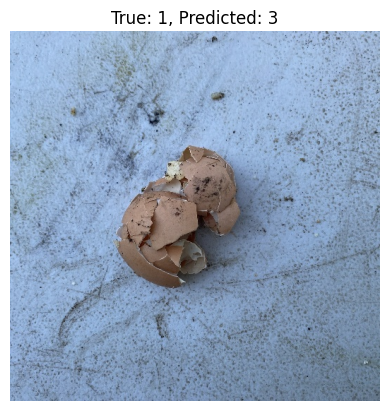

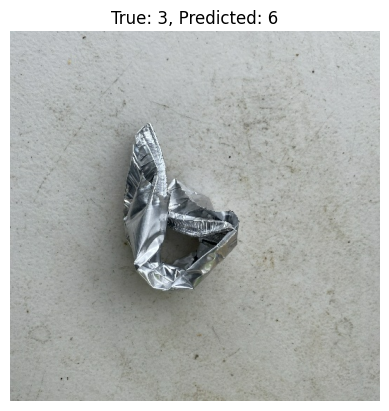

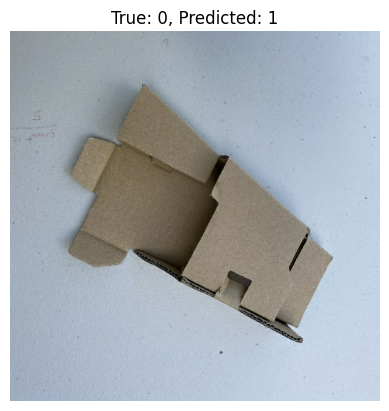

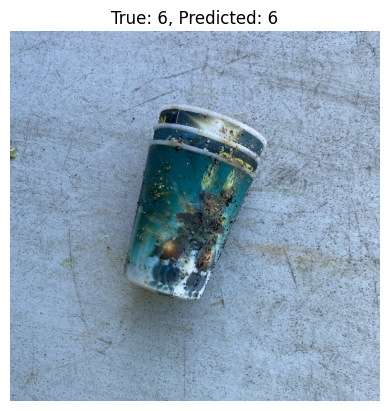

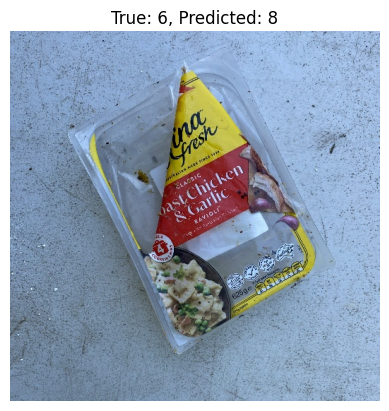

In [ ]:
import matplotlib.pyplot as plt

# Visualize a few test samples with predictions
for i, (img, label) in enumerate(test.take(5)):  # Show 5 samples
    plt.imshow(img[0].numpy().astype("uint8"))
    plt.title(f"True: {label[0].numpy()}, Predicted: {predicted_classes[i]}")
    plt.axis("off")
    plt.show()


In [ ]:
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = new_model.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score
import tensorflow as tf
import numpy as np

# Concatenate the true and predicted labels
correct_labels = tf.concat([item for item in y_true], axis=0).numpy()
predicted_labels = tf.concat([item for item in y_pred], axis=0).numpy()

# Calculate metrics
precision = precision_score(correct_labels, predicted_labels, average='weighted')
recall = recall_score(correct_labels, predicted_labels, average='weighted')
f1 = f1_score(correct_labels, predicted_labels, average='weighted')

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


F1 Score: 0.8221
Precision: 0.8722
Recall: 0.8332


In [ ]:
from sklearn.metrics import confusion_matrix

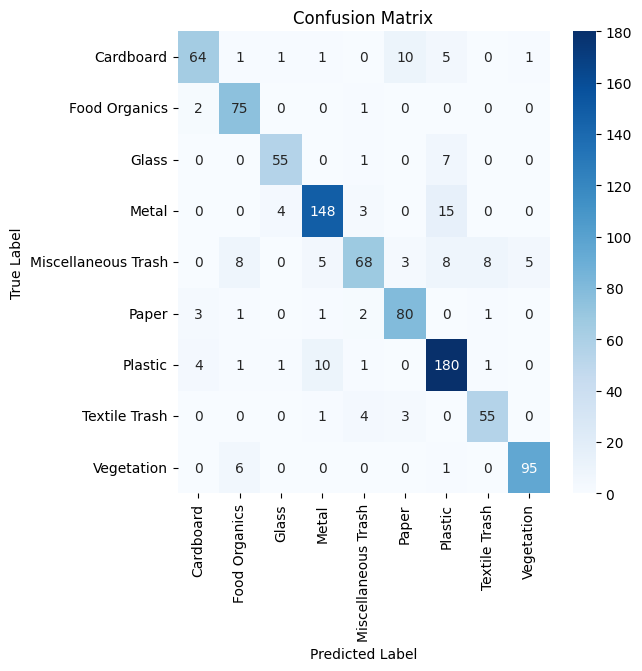

In [ ]:
classes=['Cardboard','Food Organics','Glass','Metal','Miscellaneous Trash','Paper','Plastic','Textile Trash','Vegetation']

cm = confusion_matrix(correct_labels, predicted_labels)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

# **Rexnet_150**

In [ ]:
import os, torch, shutil, numpy as np
from glob import glob; from PIL import Image
from torch.utils.data import random_split, Dataset, DataLoader
from torchvision import transforms as T
torch.manual_seed(2024)

class CustomDataset(Dataset):

    def __init__(self, root, transformations = None):

        self.transformations = transformations
        self.im_paths = [im_path for im_path in sorted(glob(f"{root}/*/*"))]

        self.cls_names, self.cls_counts, count, data_count = {}, {}, 0, 0
        for idx, im_path in enumerate(self.im_paths):
            class_name = self.get_class(im_path)
            if class_name not in self.cls_names: self.cls_names[class_name] = count; self.cls_counts[class_name] = 1; count += 1
            else: self.cls_counts[class_name] += 1

    def get_class(self, path): return os.path.dirname(path).split("/")[-1]

    def __len__(self): return len(self.im_paths)

    def __getitem__(self, idx):

        im_path = self.im_paths[idx]
        im = Image.open(im_path).convert("RGB")
        gt = self.cls_names[self.get_class(im_path)]

        if self.transformations is not None: im = self.transformations(im)

        return im, gt

def get_dls(root, transformations, bs, split = [0.9, 0.05, 0.05], ns = 4):

    ds = CustomDataset(root = root, transformations = transformations)

    total_len = len(ds)
    tr_len = int(total_len * split[0])
    vl_len = int(total_len * split[1])
    ts_len = total_len - (tr_len + vl_len)

    tr_ds, vl_ds, ts_ds = random_split(dataset = ds, lengths = [tr_len, vl_len, ts_len])

    tr_dl, val_dl, ts_dl = DataLoader(tr_ds, batch_size = bs, shuffle = True, num_workers = ns), DataLoader(vl_ds, batch_size = bs, shuffle = False, num_workers = ns), DataLoader(ts_ds, batch_size = 1, shuffle = False, num_workers = ns)

    return tr_dl, val_dl, ts_dl, ds.cls_names

root = "/kaggle/input/real-waste/realwaste-main/RealWaste"
mean, std, random_im_size, im_size = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225], 256, 224
tfs = T.Compose([T.RandomResizedCrop((random_im_size, random_im_size)), T.CenterCrop((im_size, im_size)), T.RandomHorizontalFlip(), T.ToTensor(), T.Normalize(mean = mean, std = std)])
tr_dl, val_dl, ts_dl, classes = get_dls(root = root, transformations = tfs, bs = 32)

print(len(tr_dl)); print(len(val_dl)); print(len(ts_dl)); print(classes)

134
8
239
{'Cardboard': 0, 'Food Organics': 1, 'Glass': 2, 'Metal': 3, 'Miscellaneous Trash': 4, 'Paper': 5, 'Plastic': 6, 'Textile Trash': 7, 'Vegetation': 8}


In [ ]:
import timm
from tqdm import tqdm
m = timm.create_model("rexnet_150", pretrained = True, num_classes = len(classes))
def train_setup(m): return m.to("cpu").eval(), 15, "cpu", torch.nn.CrossEntropyLoss(), torch.optim.Adam(params = m.parameters(), lr = 3e-4)
def to_device(batch, device): return batch[0].to(device), batch[1].to(device)
def get_metrics(model, ims, gts, loss_fn, epoch_loss, epoch_acc): preds = model(ims); loss = loss_fn(preds, gts); return loss, epoch_loss + (loss.item()), epoch_acc + (torch.argmax(preds, dim = 1) == gts).sum().item()

m, epochs, device, loss_fn, optimizer = train_setup(m)

save_prefix, save_dir = "waste", "/kaggle/working/saved_models"
best_acc, best_loss, threshold, not_improved, patience = 0, float("inf"), 0.01, 0, 5
tr_losses, val_losses, tr_accs, val_accs = [], [], [], []




model.safetensors:   0%|          | 0.00/39.2M [00:00<?, ?B/s]

In [ ]:
best_loss = float(torch.inf)
for epoch in range(epochs):

    epoch_loss, epoch_acc = 0, 0
    for idx, batch in tqdm(enumerate(tr_dl)):

        ims, gts = to_device(batch, device)

        loss, epoch_loss, epoch_acc = get_metrics(m, ims, gts, loss_fn, epoch_loss, epoch_acc)
        optimizer.zero_grad(); loss.backward(); optimizer.step()

    tr_loss_to_track = epoch_loss / len(tr_dl)
    tr_acc_to_track  = epoch_acc / len(tr_dl.dataset)
    tr_losses.append(tr_loss_to_track); tr_accs.append(tr_acc_to_track)

    print(f"{epoch + 1}-epoch train process is completed!")
    print(f"{epoch + 1}-epoch train loss          -> {tr_loss_to_track:.3f}")
    print(f"{epoch + 1}-epoch train accuracy      -> {tr_acc_to_track:.3f}")

    m.eval()
    with torch.no_grad():
        val_epoch_loss, val_epoch_acc = 0, 0
        for idx, batch in enumerate(val_dl):
            ims, gts = batch
            ims, gts = ims.to(device), gts.to(device)

            preds = m(ims)
            loss = loss_fn(preds, gts)
            pred_cls = torch.argmax(preds.data, dim = 1)
            val_epoch_acc += (pred_cls == gts).sum().item()
            val_epoch_loss += loss.item()

        val_loss_to_track = val_epoch_loss / len(val_dl)
        val_acc_to_track  = val_epoch_acc / len(val_dl.dataset)
        val_losses.append(val_loss_to_track); val_accs.append(val_acc_to_track)

        print(f"{epoch + 1}-epoch validation process is completed!")
        print(f"{epoch + 1}-epoch validation loss     -> {val_loss_to_track:.3f}")
        print(f"{epoch + 1}-epoch validation accuracy -> {val_acc_to_track:.3f}")

        if val_loss_to_track < (best_loss + threshold):
            os.makedirs(save_dir, exist_ok = True)
            best_loss = val_loss_to_track
            torch.save(m.state_dict(), f"{save_dir}/{save_prefix}_best_model.pth")

        else:
            not_improved += 1
            print(f"Loss value did not decrease for {not_improved} epochs")
            if not_improved == 3:
                print(f"Stop training since loss value did not decrease for {patience} epochs.")
                break

134it [12:23,  5.55s/it]

1-epoch train process is completed!
1-epoch train loss          -> 1.352
1-epoch train accuracy      -> 0.522


1-epoch validation process is completed!
1-epoch validation loss     -> 0.891
1-epoch validation accuracy -> 0.684


134it [13:12,  5.91s/it]

2-epoch train process is completed!
2-epoch train loss          -> 0.689
2-epoch train accuracy      -> 0.763


2-epoch validation process is completed!
2-epoch validation loss     -> 0.817
2-epoch validation accuracy -> 0.726


134it [13:44,  6.16s/it]

3-epoch train process is completed!
3-epoch train loss          -> 0.569
3-epoch train accuracy      -> 0.801


3-epoch validation process is completed!
3-epoch validation loss     -> 0.617
3-epoch validation accuracy -> 0.781


134it [14:18,  6.41s/it]

4-epoch train process is completed!
4-epoch train loss          -> 0.451
4-epoch train accuracy      -> 0.841


4-epoch validation process is completed!
4-epoch validation loss     -> 0.688
4-epoch validation accuracy -> 0.802
Loss value did not decrease for 1 epochs


134it [14:37,  6.55s/it]

5-epoch train process is completed!
5-epoch train loss          -> 0.414
5-epoch train accuracy      -> 0.854


5-epoch validation process is completed!
5-epoch validation loss     -> 0.488
5-epoch validation accuracy -> 0.827


134it [14:32,  6.51s/it]

6-epoch train process is completed!
6-epoch train loss          -> 0.399
6-epoch train accuracy      -> 0.869


6-epoch validation process is completed!
6-epoch validation loss     -> 0.492
6-epoch validation accuracy -> 0.823


134it [14:24,  6.45s/it]

7-epoch train process is completed!
7-epoch train loss          -> 0.291
7-epoch train accuracy      -> 0.901


7-epoch validation process is completed!
7-epoch validation loss     -> 0.537
7-epoch validation accuracy -> 0.835
Loss value did not decrease for 2 epochs


134it [15:31,  6.95s/it]

8-epoch train process is completed!
8-epoch train loss          -> 0.250
8-epoch train accuracy      -> 0.912


8-epoch validation process is completed!
8-epoch validation loss     -> 0.494
8-epoch validation accuracy -> 0.823


134it [15:09,  6.78s/it]

9-epoch train process is completed!
9-epoch train loss          -> 0.280
9-epoch train accuracy      -> 0.907


9-epoch validation process is completed!
9-epoch validation loss     -> 0.465
9-epoch validation accuracy -> 0.852


134it [15:54,  7.12s/it]

10-epoch train process is completed!
10-epoch train loss          -> 0.243
10-epoch train accuracy      -> 0.916


10-epoch validation process is completed!
10-epoch validation loss     -> 0.422
10-epoch validation accuracy -> 0.852


134it [16:01,  7.18s/it]

11-epoch train process is completed!
11-epoch train loss          -> 0.212
11-epoch train accuracy      -> 0.928


11-epoch validation process is completed!
11-epoch validation loss     -> 0.440
11-epoch validation accuracy -> 0.852
Loss value did not decrease for 3 epochs
Stop training since loss value did not decrease for 5 epochs.


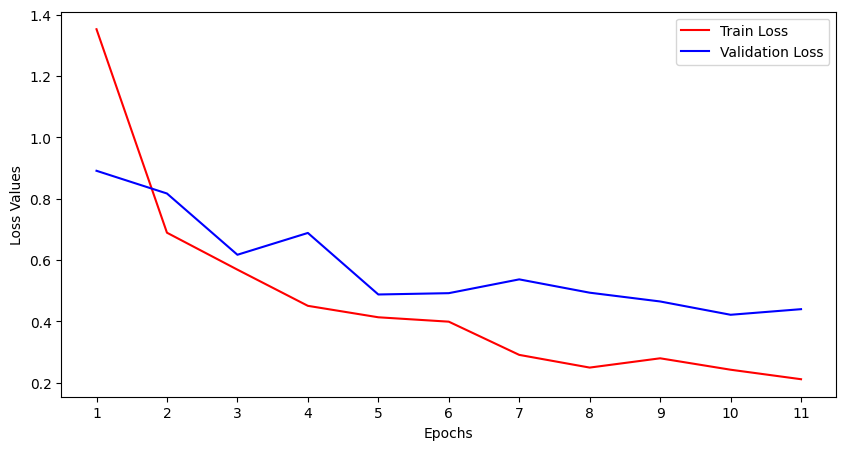

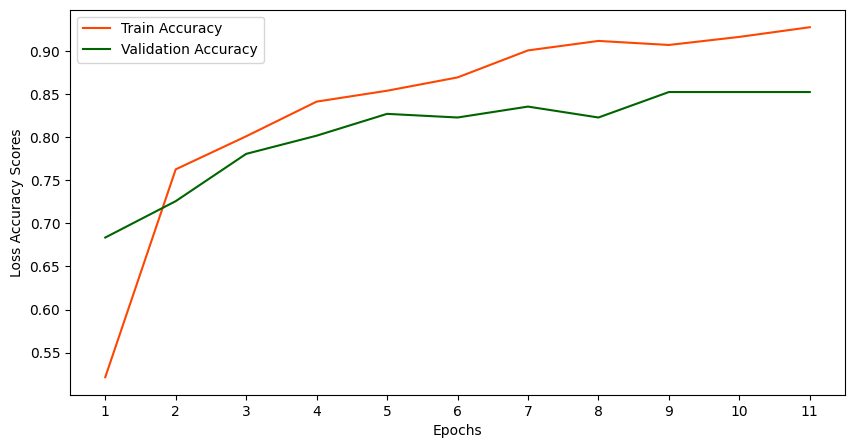

In [ ]:
from matplotlib import pyplot as plt

def learning_curves(tr_losses, val_losses, tr_accs, val_accs):

    plt.figure(figsize = (10, 5))
    plt.plot(tr_losses, label = "Train Loss", c = "red")
    plt.plot(val_losses, label = "Validation Loss", c = "blue")
    plt.xlabel("Epochs"); plt.ylabel("Loss Values")
    plt.xticks(ticks = np.arange(len(tr_losses)), labels = [i for i in range(1, len(tr_losses) + 1)])
    plt.legend(); plt.show()

    plt.figure(figsize = (10, 5))
    plt.plot(tr_accs, label = "Train Accuracy", c = "orangered")
    plt.plot(val_accs, label = "Validation Accuracy", c = "darkgreen")
    plt.xlabel("Epochs"); plt.ylabel("Loss Accuracy Scores")
    plt.xticks(ticks = np.arange(len(tr_accs)), labels = [i for i in range(1, len(tr_accs) + 1)])
    plt.legend(); plt.show()

learning_curves(tr_losses, val_losses, tr_accs, val_accs)

In [ ]:
import cv2
import random


class SaveFeatures():

    """ Extract pretrained activations"""
    features = None
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = ((output.cpu()).data).numpy()
    def remove(self): self.hook.remove()

def getCAM(conv_fs, linear_weights, class_idx):

    bs, chs, h, w = conv_fs.shape
    cam = linear_weights[class_idx].dot(conv_fs[0,:, :, ].reshape((chs, h * w)))
    cam = cam.reshape(h, w)

    return (cam - np.min(cam)) / np.max(cam)

def tensor_2_im(t, t_type = "rgb"):

    gray_tfs = T.Compose([T.Normalize(mean = [ 0.], std = [1/0.5]), T.Normalize(mean = [-0.5], std = [1])])
    rgb_tfs = T.Compose([T.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]), T.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ])])

    invTrans = gray_tfs if t_type == "gray" else rgb_tfs

    return (invTrans(t) * 255).detach().squeeze().cpu().permute(1,2,0).numpy().astype(np.uint8) if t_type == "gray" else (invTrans(t) * 255).detach().cpu().permute(1,2,0).numpy().astype(np.uint8)


/tmp/ipykernel_30/143068464.py:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(f"{save_dir}/{save_prefix}_best_model.pth"))
239it [00:04, 52.8

Accuracy of the model on the test data -> 0.870


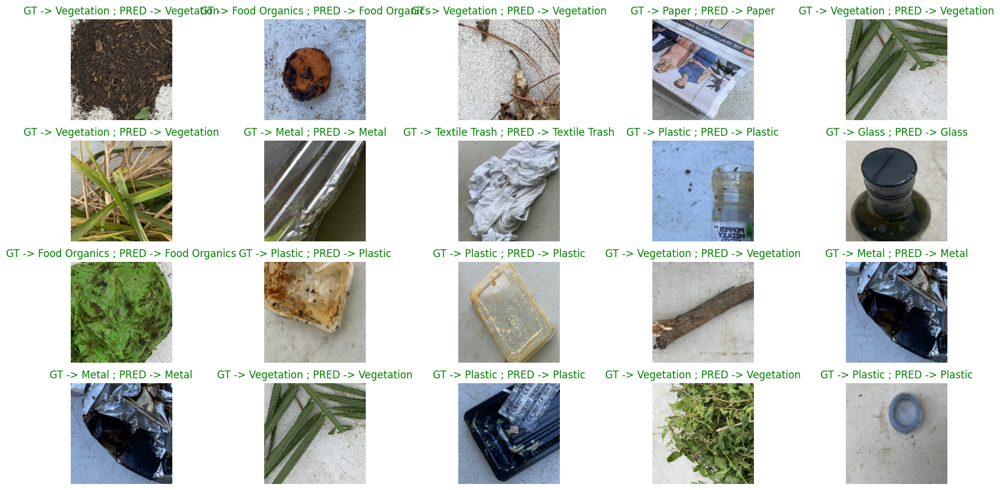

In [ ]:
def inference(model, device, test_dl, num_ims, row, final_conv, fc_params, cls_names = None):

    weight, acc = np.squeeze(fc_params[0].cpu().data.numpy()), 0
    activated_features = SaveFeatures(final_conv)
    preds, images, lbls = [], [], []
    for idx, batch in tqdm(enumerate(test_dl)):
        im, gt = to_device(batch, device)
        pred_class = torch.argmax(model(im), dim = 1)
        acc += (pred_class == gt).sum().item()
        images.append(im)
        preds.append(pred_class.item())
        lbls.append(gt.item())

    print(f"Accuracy of the model on the test data -> {(acc / len(test_dl.dataset)):.3f}")

    plt.figure(figsize = (20, 10))
    indekslar = [random.randint(0, len(images) - 1) for _ in range(num_ims)]

    for idx, indeks in enumerate(indekslar):

        im = images[indeks].squeeze()
        pred_idx = preds[indeks]
        heatmap = getCAM(activated_features.features, weight, pred_idx)

        # Start plot
        plt.subplot(row, num_ims // row, idx + 1)
        plt.imshow(tensor_2_im(im), cmap = "gray"); plt.axis("off")

        if cls_names is not None: plt.title(f"GT -> {cls_names[int(lbls[indeks])]} ; PRED -> {cls_names[int(preds[indeks])]}", color=("green" if {cls_names[int(lbls[indeks])]} == {cls_names[int(preds[indeks])]} else "red"))
        else: plt.title(f"GT -> {gt} ; PRED -> {pred}")

m.load_state_dict(torch.load(f"{save_dir}/{save_prefix}_best_model.pth"))
m.eval()
final_conv, fc_params = m.features[-1], list(m.head.fc.parameters())
inference(model = m.to(device), device = device, test_dl = ts_dl, num_ims = 20, row = 4, cls_names = list(classes.keys()), final_conv = final_conv, fc_params = fc_params)

# **Drop**

In [ ]:
import os, torch, shutil, numpy as np
from glob import glob; from PIL import Image
from torch.utils.data import random_split, Dataset, DataLoader
from torchvision import transforms as T
torch.manual_seed(2024)


class CustomDataset(Dataset):
    def __init__(self, root, transformations=None, excluded_classes=None):
        self.transformations = transformations
        self.excluded_classes = excluded_classes if excluded_classes else []
        # Filter out paths for excluded classes
        self.im_paths = [
            im_path for im_path in sorted(glob(f"{root}/*/*"))
            if self.get_class(im_path) not in self.excluded_classes
        ]

        # Rebuild class names and counts only for included classes
        self.cls_names, self.cls_counts, count = {}, {}, 0
        for im_path in self.im_paths:
            class_name = self.get_class(im_path)
            if class_name not in self.cls_names:
                self.cls_names[class_name] = count
                self.cls_counts[class_name] = 1
                count += 1
            else:
                self.cls_counts[class_name] += 1

    def get_class(self, path):
        return os.path.dirname(path).split("/")[-1]

    def __len__(self):
        return len(self.im_paths)

    def __getitem__(self, idx):
        im_path = self.im_paths[idx]
        im = Image.open(im_path).convert("RGB")
        gt = self.cls_names[self.get_class(im_path)]

        if self.transformations is not None:
            im = self.transformations(im)

        return im, gt


def get_dls(root, transformations, bs, split=[0.9, 0.05, 0.05], ns=4, excluded_classes=None):
    ds = CustomDataset(root=root, transformations=transformations, excluded_classes=excluded_classes)

    total_len = len(ds)
    tr_len = int(total_len * split[0])
    vl_len = int(total_len * split[1])
    ts_len = total_len - (tr_len + vl_len)

    tr_ds, vl_ds, ts_ds = random_split(dataset=ds, lengths=[tr_len, vl_len, ts_len])

    tr_dl = DataLoader(tr_ds, batch_size=bs, shuffle=True, num_workers=ns)
    val_dl = DataLoader(vl_ds, batch_size=bs, shuffle=False, num_workers=ns)
    ts_dl = DataLoader(ts_ds, batch_size=1, shuffle=False, num_workers=ns)

    return tr_dl, val_dl, ts_dl, ds.cls_names


In [ ]:
root = "/kaggle/input/real-waste/realwaste-main/RealWaste"
mean, std, random_im_size, im_size = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225], 256, 224
tfs = T.Compose([
    T.RandomResizedCrop((random_im_size, random_im_size)),
    T.CenterCrop((im_size, im_size)),
    T.RandomHorizontalFlip(),
    T.ToTensor(),
    T.Normalize(mean=mean, std=std)
])

excluded_classes = ["Metal", "Plastic"]
tr_dl, val_dl, ts_dl, classes = get_dls(root=root, transformations=tfs, bs=32, excluded_classes=excluded_classes)

print(len(tr_dl))  # Should reflect filtered dataset
print(len(val_dl))
print(len(ts_dl))
print(classes)     # Should not include "Metal" or "Plastic"


86
5
153
{'Cardboard': 0, 'Food Organics': 1, 'Glass': 2, 'Miscellaneous Trash': 3, 'Paper': 4, 'Textile Trash': 5, 'Vegetation': 6}


In [ ]:
import timm
from tqdm import tqdm
m = timm.create_model("rexnet_150", pretrained = True, num_classes = len(classes))
# def train_setup(m): return m.to("cpu").eval(), 15, "cpu", torch.nn.CrossEntropyLoss(), torch.optim.Adam(params = m.parameters(), lr = 3e-4)

def train_setup(m):
    device = "cuda" if torch.cuda.is_available() else "cpu"
    return m.to(device).train(), 15, device, torch.nn.CrossEntropyLoss(), torch.optim.Adam(params = m.parameters(), lr = 3e-4)

def to_device(batch, device): return batch[0].to(device), batch[1].to(device)
def get_metrics(model, ims, gts, loss_fn, epoch_loss, epoch_acc): preds = model(ims); loss = loss_fn(preds, gts); return loss, epoch_loss + (loss.item()), epoch_acc + (torch.argmax(preds, dim = 1) == gts).sum().item()

m, epochs, device, loss_fn, optimizer = train_setup(m)

save_prefix, save_dir = "waste", "/kaggle/working/saved_models"
best_acc, best_loss, threshold, not_improved, patience = 0, float("inf"), 0.01, 0, 5
tr_losses, val_losses, tr_accs, val_accs = [], [], [], []


model.safetensors:   0%|          | 0.00/39.2M [00:00<?, ?B/s]

In [ ]:
best_loss = float(torch.inf)
epochs = 10  # Fixed number of epochs to run

for epoch in range(epochs):
    epoch_loss, epoch_acc = 0, 0

    # Training loop
    for idx, batch in tqdm(enumerate(tr_dl), desc=f"Epoch {epoch + 1}/{epochs}"):
        ims, gts = to_device(batch, device)

        loss, epoch_loss, epoch_acc = get_metrics(m, ims, gts, loss_fn, epoch_loss, epoch_acc)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    tr_loss_to_track = epoch_loss / len(tr_dl)
    tr_acc_to_track = epoch_acc / len(tr_dl.dataset)
    tr_losses.append(tr_loss_to_track)
    tr_accs.append(tr_acc_to_track)

    print(f"{epoch + 1}-epoch train process is completed!")
    print(f"{epoch + 1}-epoch train loss          -> {tr_loss_to_track:.3f}")
    print(f"{epoch + 1}-epoch train accuracy      -> {tr_acc_to_track:.3f}")

    # Validation loop
    m.eval()
    with torch.no_grad():
        val_epoch_loss, val_epoch_acc = 0, 0
        for idx, batch in enumerate(val_dl):
            ims, gts = batch
            ims, gts = ims.to(device), gts.to(device)

            preds = m(ims)
            loss = loss_fn(preds, gts)
            pred_cls = torch.argmax(preds.data, dim=1)
            val_epoch_acc += (pred_cls == gts).sum().item()
            val_epoch_loss += loss.item()

        val_loss_to_track = val_epoch_loss / len(val_dl)
        val_acc_to_track = val_epoch_acc / len(val_dl.dataset)
        val_losses.append(val_loss_to_track)
        val_accs.append(val_acc_to_track)

        print(f"{epoch + 1}-epoch validation process is completed!")
        print(f"{epoch + 1}-epoch validation loss     -> {val_loss_to_track:.3f}")
        print(f"{epoch + 1}-epoch validation accuracy -> {val_acc_to_track:.3f}")

        # Save the best model based on validation loss
        if val_loss_to_track < best_loss:
            os.makedirs(save_dir, exist_ok=True)
            best_loss = val_loss_to_track
            torch.save(m.state_dict(), f"{save_dir}/{save_prefix}_best_model.pth")
            print(f"Best model saved with validation loss {best_loss:.3f}")

print("Training process completed after 10 epochs!")


Epoch 1/10: 86it [00:15,  5.61it/s]


1-epoch train process is completed!
1-epoch train loss          -> 0.203
1-epoch train accuracy      -> 0.923
1-epoch validation process is completed!
1-epoch validation loss     -> 0.203
1-epoch validation accuracy -> 0.914
Best model saved with validation loss 0.203


Epoch 2/10: 86it [00:15,  5.60it/s]


2-epoch train process is completed!
2-epoch train loss          -> 0.282
2-epoch train accuracy      -> 0.900
2-epoch validation process is completed!
2-epoch validation loss     -> 0.538
2-epoch validation accuracy -> 0.829


Epoch 3/10: 86it [00:15,  5.64it/s]

3-epoch train process is completed!
3-epoch train loss          -> 0.233
3-epoch train accuracy      -> 0.923


3-epoch validation process is completed!
3-epoch validation loss     -> 0.267
3-epoch validation accuracy -> 0.921


Epoch 4/10: 86it [00:15,  5.60it/s]


4-epoch train process is completed!
4-epoch train loss          -> 0.216
4-epoch train accuracy      -> 0.929
4-epoch validation process is completed!
4-epoch validation loss     -> 0.355
4-epoch validation accuracy -> 0.914


Epoch 5/10: 86it [00:14,  5.73it/s]

5-epoch train process is completed!
5-epoch train loss          -> 0.197
5-epoch train accuracy      -> 0.934


5-epoch validation process is completed!
5-epoch validation loss     -> 0.459
5-epoch validation accuracy -> 0.888


Epoch 6/10: 86it [00:15,  5.62it/s]

6-epoch train process is completed!
6-epoch train loss          -> 0.162
6-epoch train accuracy      -> 0.943


6-epoch validation process is completed!
6-epoch validation loss     -> 0.311
6-epoch validation accuracy -> 0.895


Epoch 7/10: 86it [00:15,  5.66it/s]


7-epoch train process is completed!
7-epoch train loss          -> 0.174
7-epoch train accuracy      -> 0.943
7-epoch validation process is completed!
7-epoch validation loss     -> 0.384
7-epoch validation accuracy -> 0.888


Epoch 8/10: 86it [00:15,  5.67it/s]


8-epoch train process is completed!
8-epoch train loss          -> 0.159
8-epoch train accuracy      -> 0.944
8-epoch validation process is completed!
8-epoch validation loss     -> 0.237
8-epoch validation accuracy -> 0.934


Epoch 9/10: 86it [00:15,  5.65it/s]

9-epoch train process is completed!
9-epoch train loss          -> 0.131
9-epoch train accuracy      -> 0.955


9-epoch validation process is completed!
9-epoch validation loss     -> 0.326
9-epoch validation accuracy -> 0.895


Epoch 10/10: 86it [00:15,  5.63it/s]

10-epoch train process is completed!
10-epoch train loss          -> 0.118
10-epoch train accuracy      -> 0.961


10-epoch validation process is completed!
10-epoch validation loss     -> 0.406
10-epoch validation accuracy -> 0.875
Training process completed after 12 epochs!


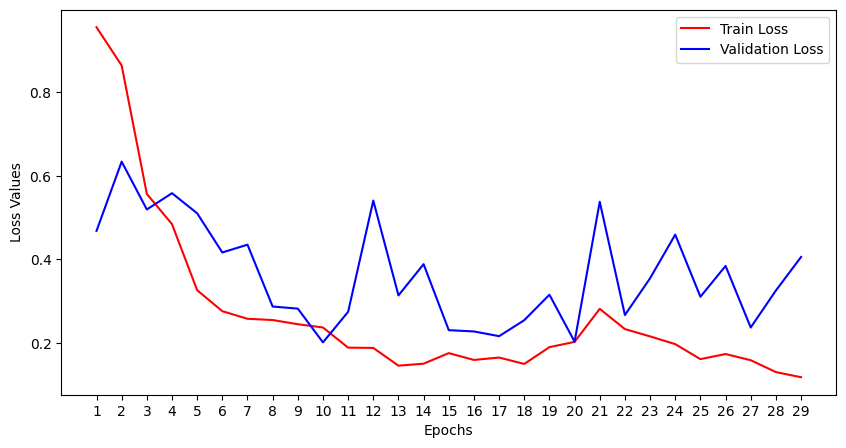

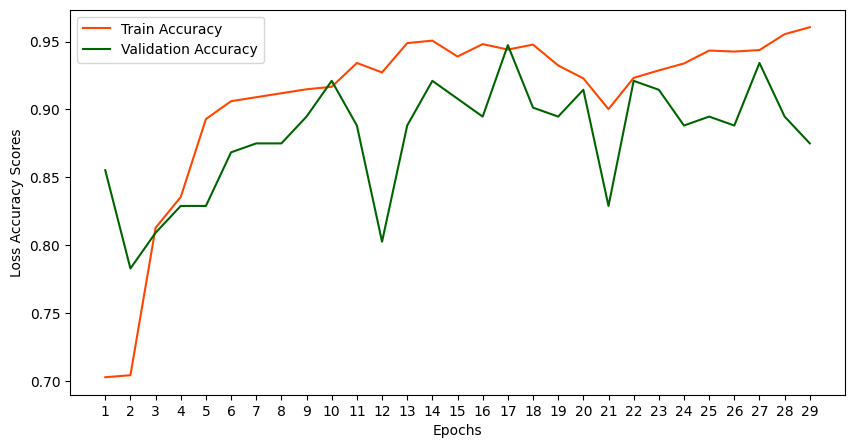

In [ ]:
from matplotlib import pyplot as plt

def learning_curves(tr_losses, val_losses, tr_accs, val_accs):

    plt.figure(figsize = (10, 5))
    plt.plot(tr_losses, label = "Train Loss", c = "red")
    plt.plot(val_losses, label = "Validation Loss", c = "blue")
    plt.xlabel("Epochs"); plt.ylabel("Loss Values")
    plt.xticks(ticks = np.arange(len(tr_losses)), labels = [i for i in range(1, len(tr_losses) + 1)])
    plt.legend(); plt.show()

    plt.figure(figsize = (10, 5))
    plt.plot(tr_accs, label = "Train Accuracy", c = "orangered")
    plt.plot(val_accs, label = "Validation Accuracy", c = "darkgreen")
    plt.xlabel("Epochs"); plt.ylabel("Loss Accuracy Scores")
    plt.xticks(ticks = np.arange(len(tr_accs)), labels = [i for i in range(1, len(tr_accs) + 1)])
    plt.legend(); plt.show()

learning_curves(tr_losses, val_losses, tr_accs, val_accs)

In [ ]:
import random
from matplotlib import pyplot as plt


def tensor_2_im(t, t_type = "rgb"):

    gray_tfs = T.Compose([T.Normalize(mean = [ 0.], std = [1/0.5]), T.Normalize(mean = [-0.5], std = [1])])
    rgb_tfs = T.Compose([T.Normalize(mean = [ 0., 0., 0. ], std = [ 1/0.229, 1/0.224, 1/0.225 ]), T.Normalize(mean = [ -0.485, -0.456, -0.406 ], std = [ 1., 1., 1. ])])

    invTrans = gray_tfs if t_type == "gray" else rgb_tfs

    return (invTrans(t) * 255).detach().squeeze().cpu().permute(1,2,0).numpy().astype(np.uint8) if t_type == "gray" else (invTrans(t) * 255).detach().cpu().permute(1,2,0).numpy().astype(np.uint8)

/tmp/ipykernel_30/113446487.py:54: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  m.load_state_dict(torch.load(f"{save_dir}/{save_prefix}_best_model.pth"))
153it [00:02, 57.7

Accuracy of the model on the test data -> 0.902


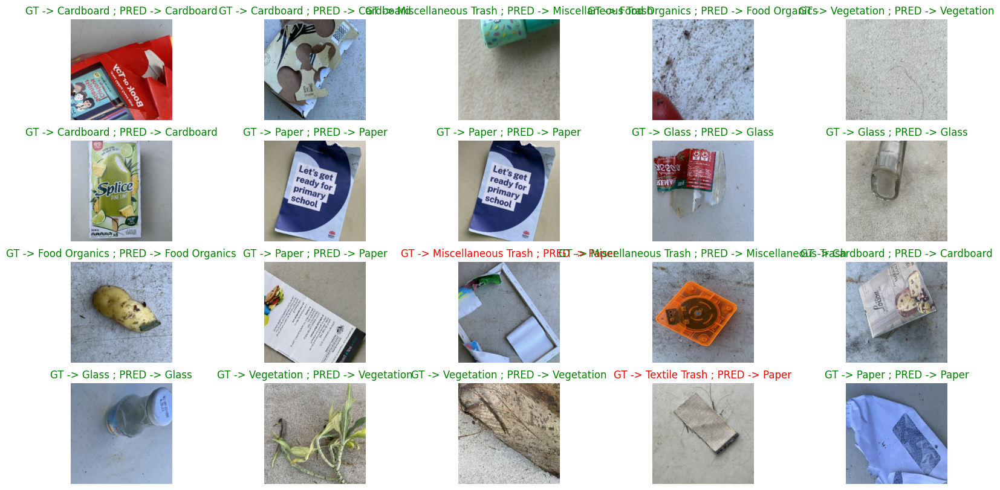

In [ ]:
import cv2
import random


class SaveFeatures():

    """ Extract pretrained activations"""
    features = None
    def __init__(self, m):
        self.hook = m.register_forward_hook(self.hook_fn)
    def hook_fn(self, module, input, output):
        self.features = ((output.cpu()).data).numpy()
    def remove(self): self.hook.remove()

def getCAM(conv_fs, linear_weights, class_idx):

    bs, chs, h, w = conv_fs.shape
    cam = linear_weights[class_idx].dot(conv_fs[0,:, :, ].reshape((chs, h * w)))
    cam = cam.reshape(h, w)

    return (cam - np.min(cam)) / np.max(cam)

def inference(model, device, test_dl, num_ims, row, final_conv, fc_params, cls_names = None):

    weight, acc = np.squeeze(fc_params[0].cpu().data.numpy()), 0
    activated_features = SaveFeatures(final_conv)
    preds, images, lbls = [], [], []
    for idx, batch in tqdm(enumerate(test_dl)):
        im, gt = to_device(batch, device)
        pred_class = torch.argmax(model(im), dim = 1)
        acc += (pred_class == gt).sum().item()
        images.append(im)
        preds.append(pred_class.item())
        lbls.append(gt.item())

    print(f"Accuracy of the model on the test data -> {(acc / len(test_dl.dataset)):.3f}")

    plt.figure(figsize = (20, 10))
    indekslar = [random.randint(0, len(images) - 1) for _ in range(num_ims)]

    for idx, indeks in enumerate(indekslar):

        im = images[indeks].squeeze()
        pred_idx = preds[indeks]
        heatmap = getCAM(activated_features.features, weight, pred_idx)

        # Start plot
        plt.subplot(row, num_ims // row, idx + 1)
        plt.imshow(tensor_2_im(im), cmap = "gray"); plt.axis("off")

        if cls_names is not None: plt.title(f"GT -> {cls_names[int(lbls[indeks])]} ; PRED -> {cls_names[int(preds[indeks])]}", color=("green" if {cls_names[int(lbls[indeks])]} == {cls_names[int(preds[indeks])]} else "red"))
        else: plt.title(f"GT -> {gt} ; PRED -> {pred}")

m.load_state_dict(torch.load(f"{save_dir}/{save_prefix}_best_model.pth"))
m.eval()
final_conv, fc_params = m.features[-1], list(m.head.fc.parameters())
inference(model = m.to(device), device = device, test_dl = ts_dl, num_ims = 20, row = 4, cls_names = list(classes.keys()), final_conv = final_conv, fc_params = fc_params)